# **Proyecto Final - Introducción a los Sistemas Inteligentes**

* Nicolás Martinez López
* Gabriel Santiago Delgado Lozano
* Cesar Arthuro Lemos Silva

# **Bibliotecas y Demás Funciones Utilizadas**

In [238]:
%pip install pillow numpy pandas matplotlib seaborn

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [239]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import random

Función para Ver una Imagen

In [240]:
def index_imagen(X, y, nombres, index, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
        ax.set_title(f'y={y[index]} Imagen: {nombres[index]}')
    else:
        ax.set_title(f'y={y[index]} Región {nombres[index].split("_")[1]}')
    ax.imshow(X[index].reshape((512, 512, 3)), cmap='gray')
    
    ax.axis('off')
    if ax is None:
        plt.show()

In [241]:
def buscar_indices(arreglo, parametro):
    return [i for i, x in enumerate(arreglo) if parametro in x]

Función Para Ver las Imágenes de Un Paciente

In [242]:
def imagenes_paciente(X, y, nombres, paciente):
    indices = buscar_indices(nombres, paciente)
    num_imagenes = len(indices)
    
    # Calcular el número de filas y columnas
    num_filas = min(5, num_imagenes)  # Máximo 3 filas
    num_columnas = (num_imagenes + num_filas - 1) // num_filas  # Redondear hacia arriba
    
    # Crear la figura y los subgráficos
    
    fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 15))
    
    fig.suptitle(f'Paciente: {paciente}', fontsize=20)
    
    # Aplanar los ejes si hay más de una fila
    if num_filas > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    
    for i, index in enumerate(indices):
        index_imagen(X, y, nombres, index, axes[i])
    
    # Ocultar los ejes vacíos
    for j in range(i + 1, num_filas * num_columnas):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()

In [243]:
def grafico_densidad(y0, y1, titley0, titley1):
    mediay0 = np.mean(y0)
    mediay1 = np.mean(y1)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Gráfico de densidad para las etiquetas de entrenamiento
    sns.kdeplot(pd.Series(y0), fill=True, color='blue', ax=axes[0])
    axes[0].axvline(mediay0, color='red', linestyle='--', label=f'Media: {mediay0:.2f}')
    axes[0].set_title(titley0)
    axes[0].set_xlabel('Etiqueta')
    axes[0].set_ylabel('Densidad')
    axes[0].legend()

    # Gráfico de densidad para las etiquetas de validación
    sns.kdeplot(pd.Series(y1), fill=True, color='blue', ax=axes[1])
    axes[1].axvline(mediay1, color='red', linestyle='--', label=f'Media: {mediay1:.2f}')
    axes[1].set_title(titley1)
    axes[1].set_xlabel('Etiqueta')
    axes[1].set_ylabel('Densidad')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# **Descripción del Problema**

## *Términos Técnicos*

**Cáncer de Mama**

Definición: El cáncer de mama es una enfermedad en la que células de la mama alteradas se multiplican sin control y forman tumores que, de no tratarse, pueden propagarse por todo el cuerpo y causar la muerte.

Extraído de: https://www.who.int/es/news-room/fact-sheets/detail/breast-cancer

**Tratamiento Neoadjuvante**

Definición: Tratamiento que se administra como primer paso para reducir el tamaño del tumor antes del tratamiento principal que generalmente consiste en cirugía. Entre los ejemplos de terapia adyuvante están la quimioterapia, la radioterapia y la terapia hormonal. Es un tipo de terapia de inducción.

Extraído de: https://www.cancer.gov/espanol/publicaciones/diccionarios/diccionario-cancer/def/terapia-neoadyuvante

**Patología**

Definición: rama fundamental de la Medicina que se ocupa del estudio de las enfermedades. Su objetivo principal es entender las causas (etiología), los mecanismos de desarrollo (patogenia), los cambios estructurales en los tejidos y órganos del cuerpo (alteraciones morfológicas) y los efectos de estas enfermedades (manifestaciones clínicas). Como disciplina médica, la patología actúa como un puente entre la ciencia básica y la medicina clínica, proporcionando la base para el diagnóstico y tratamiento de las enfermedades.

Extraído de: https://www.cun.es/diccionario-medico/terminos/patologia

**Celularidad**

Definición: Composición celular de un tejido orgánico, ya desde el punto de vista de su cantidad, ya desde el de su calidad

Extraído de: https://dem.colmex.mx/ver/celularidad


**Imágenes de Diapositivas Completas - WSI - Whole Slide Images**

Definición: La imagen de diapositiva completa es la manipulación de imágenes digitales de secciones de tejido que se han escaneado con diferentes aumentos. Esto permite al espectador acercarse a áreas de interés, simulando así el examen de diapositivas de vidrio bajo un microscopio tradicional.

Extraído de: https://doctorhoogstra.com/wiki/imagenes-de-diapositivas-enteras/#:~:text=La%20imagen%20de%20diapositiva%20completa%20es%20la%20manipulaci%C3%B3n,de%20diapositivas%20de%20vidrio%20bajo%20un%20microscopio%20tradicional.

## *El Problema*

Detectar el cáncer de mama a tiempo es crucial para tratarlo con éxito. Las mamografías son radiografías de las mamas que pueden encontrar cambios anormales antes de que se sientan o causen síntomas. Sin embargo, interpretar estas imágenes puede variar entre médicos, lo que puede afectar el diagnóstico.

La detección del cáncer de mama en sus etapas tempranas es de vital importancia para poder administrar tratamientos neoadjuvantes antes de que los tumores crezcan demasiado. Para esto, los oncologos analizan las imágenes de diapositivas completas para encontrar anomalías en las celulas de mama. Sin embargo, cada médico puede tener una interpretación diferente o un detalle crucial podría ir por encima del radar. Entonces, surge la necesidad de tener métodos que faciliten e incrementen la precisión del diagnóstico.

## *Relación del Machine Learning Con el Problema*

El machine learning es una herramienta que responde a la necesidad de tener un método que logre clasificar las IDC de tejidos de mama. La iniciativa "BreastPathQ: Cancer Cellularity Challenge 2019" fue creada para que la comunidad de machine learning creara y propusiera modelos que lograran clasificar tejidos cancerígenos con mayor precisión y consistencia.

# **Importación de Datos**

Rutas Correspondientes a las Carpetas de las Imágenes de cada Conjunto de Datos

In [244]:
train_folder = './breastpathq/datasets/train'
validation_folder = './breastpathq/datasets/validation'
test_folder = './breastpathq-test/test_patches'

## *Importación Train*

In [245]:
labels_train = pd.read_csv('./breastpathq/datasets/train_labels.csv')
regiones = []

In [246]:
X_train = []
y_train = []
train_nombres_imagenes = []
for index, row in labels_train.iterrows():
    image = Image.open(os.path.join(train_folder, str(int(row['slide'])) + '_' + str(int(row['rid'])) + '.tif'))
    image = np.array(image)
    #print(image.shape)#3 Dimensiones
    X_train.append(image.flatten())
    #print(len(image.flatten()))#1 Dimensión
    y_train.append(row['y'])
    train_nombres_imagenes.append(str(int(row['slide'])) + '_' + str(int(row['rid'])))
    if str(int(row['rid'])) not in regiones:
        regiones.append(str(int(row['rid'])))

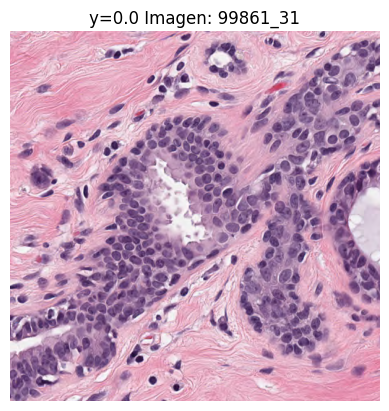

In [247]:
index_imagen(X_train, y_train, train_nombres_imagenes, 30)

## *Importación Validation*

In [248]:
labels_validation = pd.read_csv('./breastpathq-test/val_labels.csv')

In [249]:
X_validation = []
y_validation = []
validation_nombres_imagenes = []
for index, row in labels_validation.iterrows():
    image = Image.open(os.path.join(validation_folder, str(int(row['slide'])) + '_' + str(int(row['rid'])) + '.tif'))
    image = np.array(image)
    X_validation.append(image.flatten())
    y_validation.append(row['y'])
    validation_nombres_imagenes.append(str(int(row['slide'])) + '_' + str(int(row['rid'])))

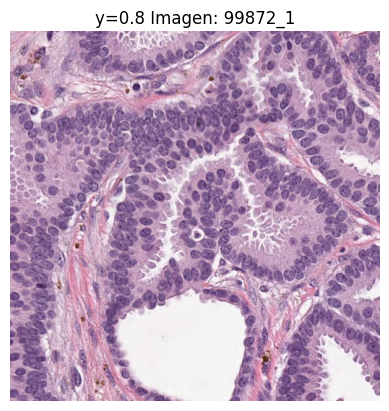

In [250]:
index_imagen(X_validation, y_validation, validation_nombres_imagenes, 30)

## *Importación Test*

In [251]:
X_test = []
test_nombres_imagenes = []
for image_name in os.listdir(test_folder):
    test_nombres_imagenes.append(os.path.splitext(image_name)[0])
    image = Image.open(os.path.join(test_folder, image_name))
    image = np.array(image)#3 Dimensiones
    X_test.append(image.flatten()) #1 Dimensión 

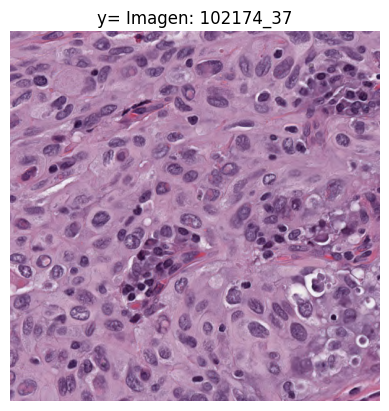

In [252]:
index_imagen(X_test, [""]*len(X_test), test_nombres_imagenes, 30)

# **Exploración de Datos**

## *Distribución de las Etiquetas*

c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na opti

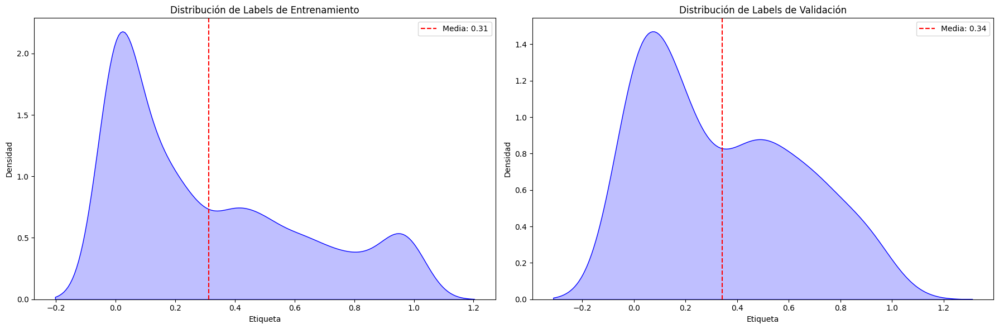

In [253]:
grafico_densidad(y_train, y_validation, 'Distribución de Labels de Entrenamiento', 'Distribución de Labels de Validación')

## *Distribución del Promedio de los Pacientes*

In [254]:
pacientes_train = list(set([nombre.split('_')[0] for nombre in train_nombres_imagenes]))
pacientes_validation = list(set([nombre.split('_')[0] for nombre in validation_nombres_imagenes]))

In [255]:
print(f'Número de pacientes en el conjunto de entrenamiento: {len(pacientes_train)}')
print(f'Número de pacientes en el conjunto de validación: {len(pacientes_validation)}')

Número de pacientes en el conjunto de entrenamiento: 63
Número de pacientes en el conjunto de validación: 6


In [256]:
y_mean_pacientes_train = []
y_mean_pacientes_validation = []
for paciente in pacientes_train:
    indices = buscar_indices(train_nombres_imagenes, paciente)
    y_mean_pacientes_train.append(np.mean([y_train[i] for i in indices]))

for paciente in pacientes_validation:
    indices = buscar_indices(validation_nombres_imagenes, paciente)
    y_mean_pacientes_validation.append(np.mean([y_validation[i] for i in indices]))

c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na opti

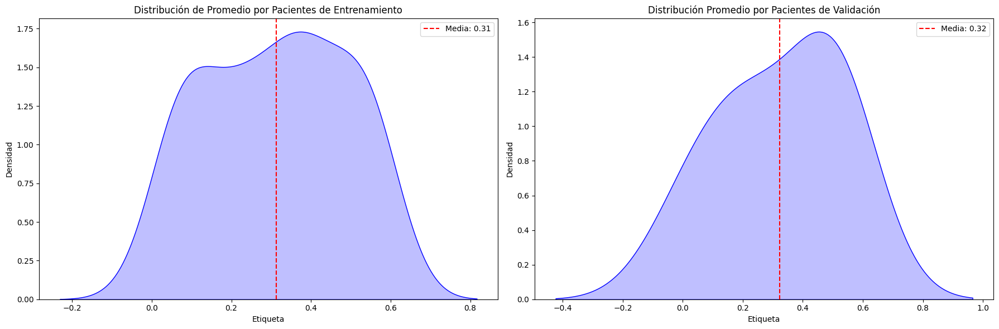

In [257]:
grafico_densidad(y_mean_pacientes_train, y_mean_pacientes_validation, 'Distribución de Promedio por Pacientes de Entrenamiento', 'Distribución Promedio por Pacientes de Validación')

## *Distribución de los Labels de cada región*

In [258]:
labels_region = dict()
regiones.sort()
promediosregion = dict()

In [259]:
for region in regiones:
    labels_region[region] = []
for region in regiones:
    indices_region = buscar_indices(train_nombres_imagenes, "_"+region)
    for index in indices_region:
        labels_region[region].append(y_train[index])

c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\marti\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na opti

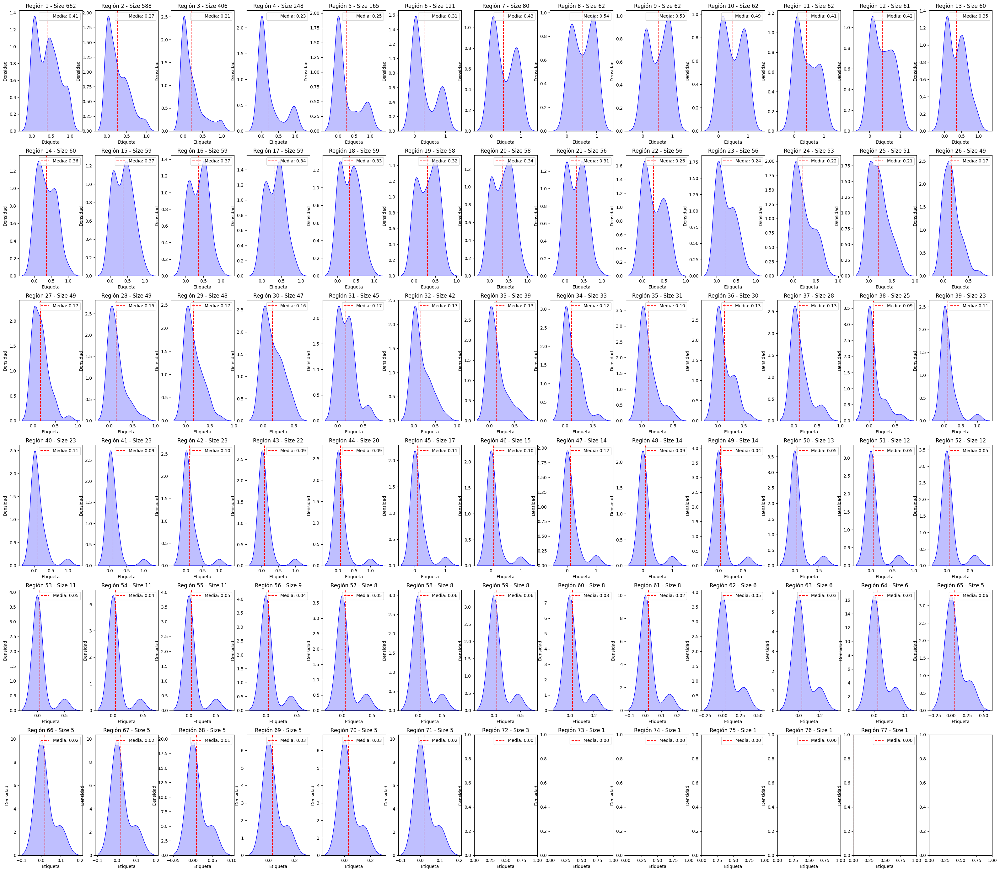

In [260]:
num_filas = 6
num_columnas = (len(regiones)+num_filas-1)// num_filas  # Redondear hacia arriba
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(40, 35))
axes = axes.flatten()
for region in regiones:
    media = np.mean(labels_region[region])
    promediosregion[region] = media
    sns.kdeplot(pd.Series(labels_region[region]), fill=True, color='blue', ax=axes[int(region)-1])
    axes[int(region)-1].axvline(media, color='red', linestyle='--', label=f'Media: {media:.2f}')
    axes[int(region)-1].set_title(f'Región {region} - Size {len(labels_region[region])}')
    axes[int(region)-1].set_xlabel('Etiqueta')
    axes[int(region)-1].set_ylabel('Densidad')
    axes[int(region)-1].legend()

Las Regiones Ordenadas de Mayor a Menor de Acuerdo a su etiqueta son

In [261]:
#print(promediosregion)
print(dict(sorted(promediosregion.items(), key=lambda item: item[1], reverse=True)))

{'8': 0.5406451612903225, '9': 0.5285483870967741, '10': 0.48661290322580647, '7': 0.425625, '12': 0.41836065573770487, '11': 0.4127419354838709, '1': 0.4052870090634441, '15': 0.37457627118644066, '16': 0.3688135593220339, '14': 0.359, '13': 0.3466666666666667, '20': 0.3448275862068966, '17': 0.3435593220338982, '18': 0.326271186440678, '19': 0.3184482758620689, '21': 0.3076785714285714, '6': 0.30669421487603304, '2': 0.2721938775510204, '22': 0.2625, '5': 0.2516969696969697, '23': 0.23892857142857143, '4': 0.22560483870967743, '24': 0.2164150943396226, '25': 0.21019607843137256, '3': 0.20613300492610837, '26': 0.16938775510204082, '27': 0.1673469387755102, '32': 0.16666666666666666, '31': 0.16555555555555557, '29': 0.165, '30': 0.15531914893617021, '28': 0.15142857142857144, '33': 0.13384615384615386, '36': 0.12833333333333333, '37': 0.12678571428571428, '34': 0.1203030303030303, '47': 0.11785714285714287, '39': 0.11304347826086956, '40': 0.11043478260869563, '45': 0.1088235294117647

## *Análisis de Imágenes*

Se realizará Para 4 Casos diferentes, buscando encontrar de alguna manera alguna diferenciación que permita establecer de una mejor manera el label. Estos 4 Casos Son:
*   **Label Igual a 0**
*   **Label Menor o Igual a 0.4**
*   **Label Mayor o Igual a 0.7**
*   **Label Igual a 1**

En cada Caso se Analizarán 12 Imagenes

In [262]:
numimagenes = 12

### *Análisis de Imágenes Cuya Etiqueta es = 0*

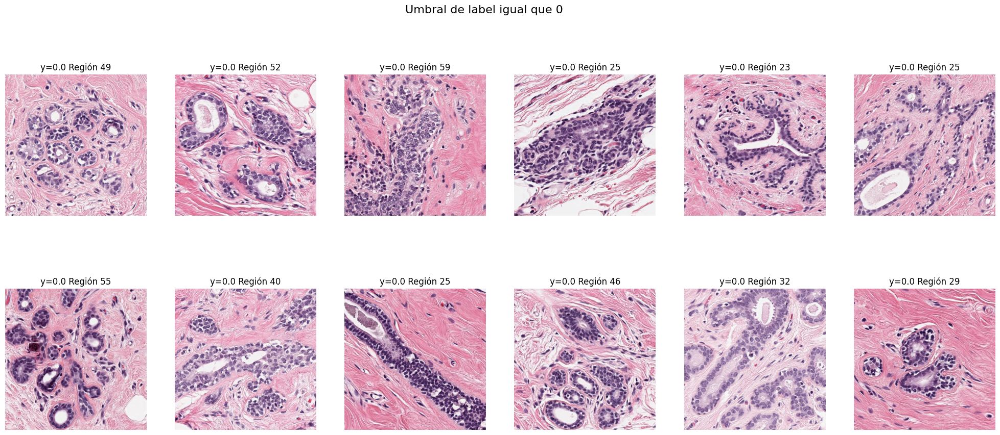

In [263]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 0
indices_train = [i for i, y in enumerate(y_train) if y == umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### *Análisis de las Imágenes Cuya Etiqueta es <= 0.4*

Se ha escogido <=0.4 ya que consideramos que este es un valor pequeño con respecto a aquellos que pueden tener un mayor indice, de manera que se pueda identificar algún patrón de las células cancerigenas, a partir de este conjunto de datos se analizará un subconjunto considerable que permita observar de mejor manera el patrón.

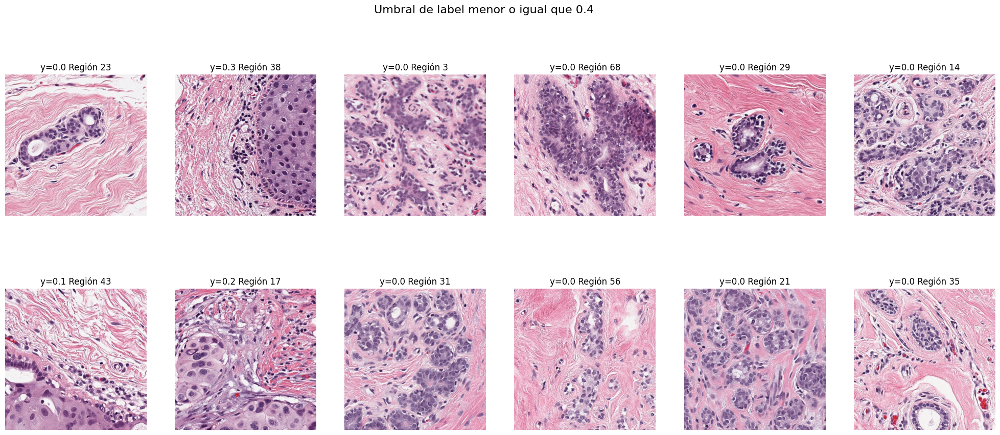

In [264]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 0.4
indices_train = [i for i, y in enumerate(y_train) if y <= umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label menor o igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### *Análisis de Imágenes Cuya Etiqueta es >= 0.7*

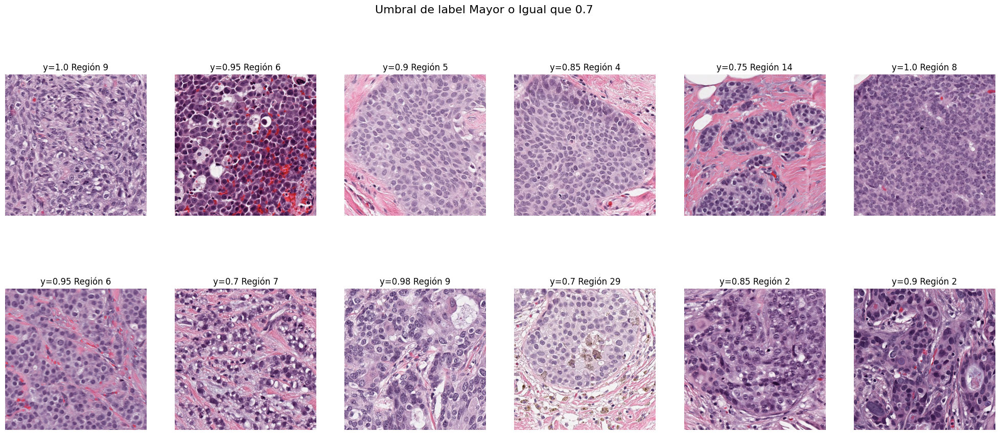

In [265]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 0.7
indices_train = [i for i, y in enumerate(y_train) if y >= umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label Mayor o Igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

### *Análisis de Imágenes Cuya Etiqueta es = 1.0*

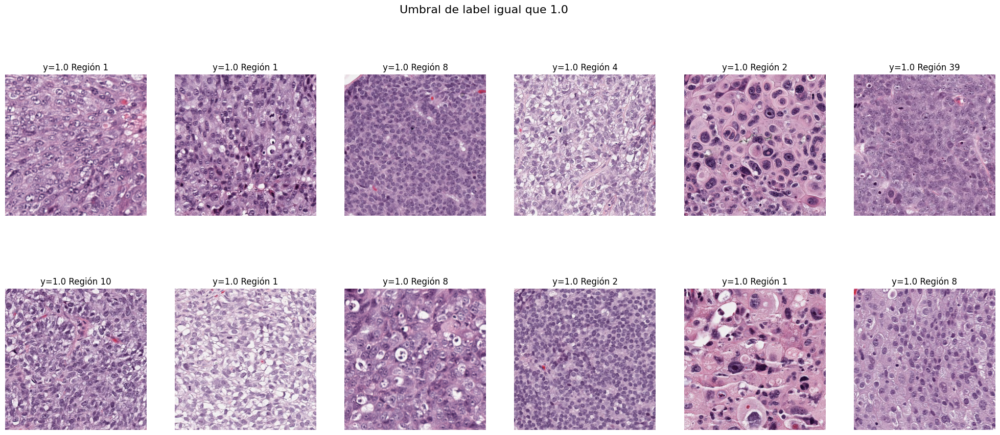

In [266]:
##Seleccionar las imágenes que cumplen con este criterio
umbral = 1.0
indices_train = [i for i, y in enumerate(y_train) if y == umbral]
imagenes_escogiadas_train = random.sample(indices_train, numimagenes)
num_filas = 2
num_columnas = (numimagenes + num_filas - 1) // num_filas
fig, axes = plt.subplots(num_filas, num_columnas, figsize=(25, 10))
axes = axes.flatten()
fig.suptitle(f'Umbral de label igual que {umbral}', fontsize=16)
for i, indice in enumerate(imagenes_escogiadas_train):
    index_imagen(X_train, y_train, train_nombres_imagenes, indice, axes[i])

# **Modelos y Exploración de Hiper-Parámetros**

# **Evaluación del desempeño sistemática del modelo final seleccionado**

# **Conclusiones y Resultados**

# **Generación del Archivo de Envío**